# Integration, label transfer and multi-scale analysis with scPoli

In this notebook we demonstrate an example workflow of data integration, reference mapping, label transfer and multi-scale analysis of sample and cell embeddings using scPoli. We integrate pancreas data obtained from the [scArches reproducibility repository](https://github.com/theislab/scArches-reproducibility).

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "0"

In [2]:
import torch

In [3]:
torch.cuda.is_available()

True

In [3]:
import os
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import cosine_similarity

from scarches.dataset.trvae.data_handling import remove_sparsity
from scarches.models.scpoli import scPoli

import warnings
warnings.filterwarnings('ignore')
# %load_ext autoreload
# %autoreload 2

 captum (see https://github.com/pytorch/captum).
INFO:pytorch_lightning.utilities.seed:Global seed set to 0
/gpfs/space/home/dzvenymy/.conda/envs/scarches_p_3_10/lib/python3.10/site-packages/pytorch_lightning-1.7.7-py3.10.egg/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/gpfs/space/home/dzvenymy/.conda/envs/scarches_p_3_10/lib/python3.10/site-packages/pytorch_lightning-1.7.7-py3.10.egg/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [5]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = (4, 4)

In [4]:
!free -h

              total        used        free      shared  buff/cache   available
Mem:           503G         90G        407G         57M        5.9G        411G
Swap:           63G         22G         41G


# Load data

In [5]:
adata_pbmc = sc.read('/gpfs/space/home/dzvenymy/scarches/data/human_pbmc_normalized_hvg_reviwer_2_batches.h5ad')

In [18]:
adata_pbmc_rare = sc.read('/gpfs/space/home/dzvenymy/scarches/data/rare_pdc_pbmc.h5ad')

In [16]:
adata_r = sc.read('/gpfs/space/projects/genomic_references/Randoplh_2021/h5ad/SRX9628626/counts_unfiltered/adata.h5ad')

In [6]:
pbmc_full = sc.read('/gpfs/space/home/dzvenymy/scarches/data/pbmc/pbmc_raw.h5ad')

## Kallisto data

In [ ]:
/gpfs/space/projects/genomic_references/scRNAseq_counts/kallisto

In [ ]:
adata_r = sc.read('/gpfs/space/projects/genomic_references/scRNAseq_counts/kallisto/Randolph_2021/SRX9628650.h5ad')

In [26]:
adata_r.var

,gene_name
gene_id,
ENSG00000223972.5,DDX11L1
ENSG00000227232.5,WASH7P
ENSG00000278267.1,MIR6859-1
ENSG00000243485.5,MIR1302-2HG
ENSG00000284332.1,MIR1302-2
...,...
ENSG00000124334.18_PAR_Y,IL9R
ENSG00000270726.6_PAR_Y,ENSG00000270726
ENSG00000185203.12_PAR_Y,WASIR1


In [4]:
adata_one = sc.read('/gpfs/space/projects/genomic_references/scRNAseq_counts/kallisto/OneK1K/SAMN25948861.h5ad')

In [5]:
adata_one.obs.head()

""
barcode
AAACCTGAGAAACCAT
AAACCTGAGAAACCGC
AAACCTGAGAAACCTA
AAACCTGAGAAACGAG
AAACCTGAGAAACGCC


In [6]:
# SAMN25948860
adata_one.X.shape

(714214, 61533)

In [8]:
# SAMN25948861
adata_one.X.shape

(724846, 61533)

In [14]:
adata_one.var.head()

,gene_name
gene_id,
ENSG00000223972.5,DDX11L1
ENSG00000227232.5,WASH7P
ENSG00000278267.1,MIR6859-1
ENSG00000243485.5,MIR1302-2HG
ENSG00000284332.1,MIR1302-2


In [16]:
adata_perez = sc.read('/gpfs/space/projects/genomic_references/scRNAseq_counts/kallisto/Perez_2022/flare1_1.h5ad')

In [17]:
adata_perez.X.shape

(555136, 61533)

In [18]:
adata_perez.var.head()

,gene_name
gene_id,
ENSG00000223972.5,DDX11L1
ENSG00000227232.5,WASH7P
ENSG00000278267.1,MIR6859-1
ENSG00000243485.5,MIR1302-2HG
ENSG00000284332.1,MIR1302-2


In [19]:
adata_perez.obs.head()

""
barcode
AAACCTGAGAAACCGC
AAACCTGAGAAACCTA
AAACCTGAGAAACGCC
AAACCTGAGAAAGTGG
AAACCTGAGAACAACT


# Sample cells from pbmc full data

In [14]:
pbmc_full.obs['cell_type_for_integration'].value_counts(normalize=True)

T cell                          5.212987e-01
monocyte                        2.081184e-01
B cell                          1.334113e-01
innate lymphoid cell            9.530583e-02
dendritic cell                  1.240259e-02
unlabeled                       1.207122e-02
megakaryocyte                   7.396407e-03
hematopoietic precursor cell    5.406136e-03
erythroid lineage cell          2.131792e-03
granulocyte                     1.793756e-03
progenitor cell                 3.612381e-04
malignant cell                  2.936822e-04
mast cell                       8.332318e-06
club cell                       6.409476e-07
Name: cell_type_for_integration, dtype: float64

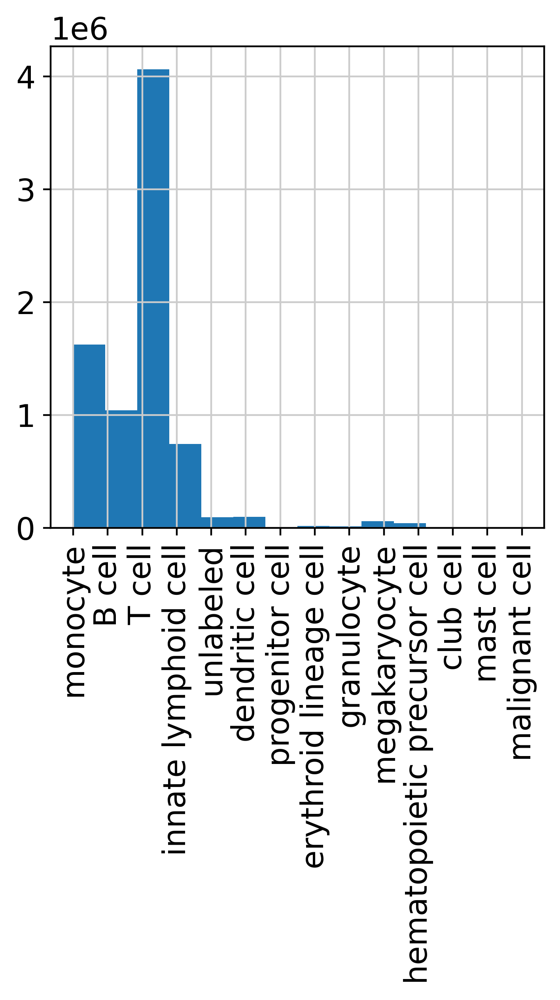

In [12]:
pbmc_full.obs['cell_type_for_integration'].hist(bins=14)
plt.xticks(rotation=90)
plt.show()

In [44]:
# indx = pbmc_full.obs.sample(frac=0.05, random_state=3, ignore_index=True, weights=pbmc_full.obs.groupby('cell_type_for_integration')['cell_type_for_integration'].transform('count'))

weights = len(pbmc_full.obs) / (14 * pbmc_full.obs.groupby('cell_type_for_integration')['cell_type_for_integration'].transform('count'))
indx = pbmc_full.obs.sample(frac=0.02, random_state=1, ignore_index=True, weights=weights)
obs = pbmc_full.obs.iloc[list(indx.index)]
x = pbmc_full.X[list(indx.index)]
pbmc_frac = sc.AnnData(X=x, var=pbmc_full.var, obs=obs)

In [45]:
pbmc_frac.obs['cell_type_for_integration'].value_counts()

T cell                          71527
monocyte                        51202
B cell                          18551
innate lymphoid cell            10753
dendritic cell                   2555
unlabeled                        1338
progenitor cell                    93
club cell                           0
erythroid lineage cell              0
granulocyte                         0
hematopoietic precursor cell        0
malignant cell                      0
mast cell                           0
megakaryocyte                       0
Name: cell_type_for_integration, dtype: int64

In [5]:
pbmc_frac.write('../data/pbmc/pbmc_sample_0_0_5_not_weighted.h5ad')

In [47]:
pbmc_frac.write('../data/pbmc/pbmc_sample_0_0_2_not_weighted.h5ad')

In [5]:
pbmc_frac = sc.read('../data/pbmc/pbmc_sample_0_0_2_not_weighted.h5ad')

In [6]:
len(pbmc_frac)

156019

<AxesSubplot: >

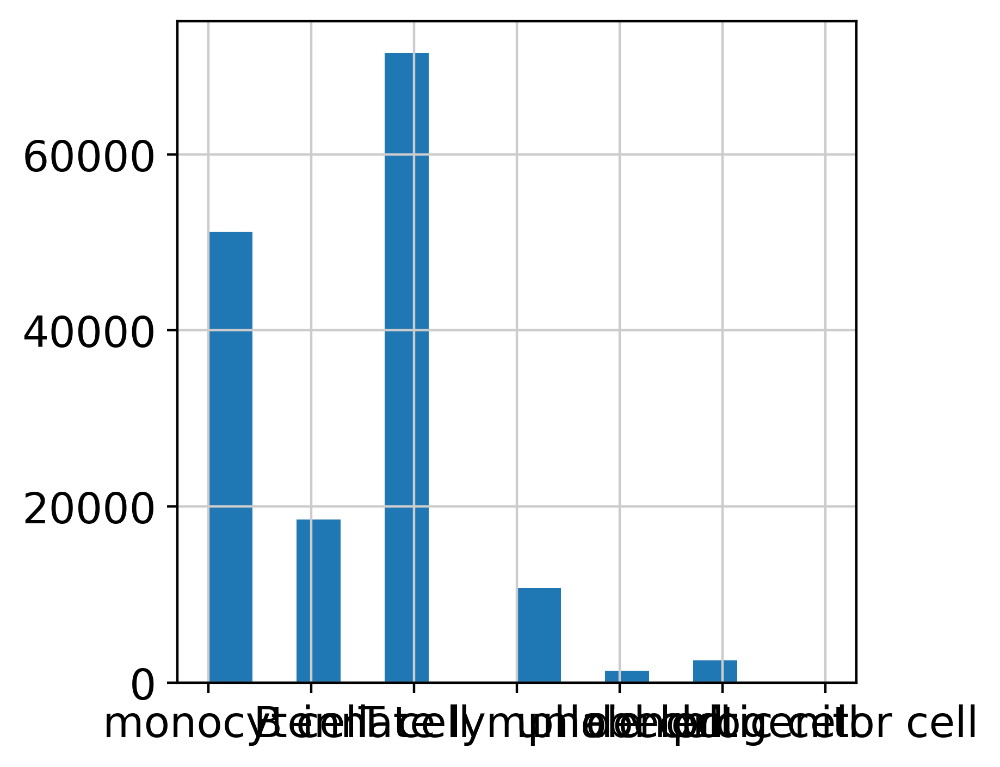

In [7]:
pbmc_frac.obs['cell_type_for_integration'].hist(bins=14)

In [18]:
pbmc_frac.obs.columns

Index(['dataset', 'sample_ID_czi', 'subject_ID_czi',
       'cell_type_ontology_term_id', 'cell_type', 'total_counts_lisa',
       'batch_czi', 'assay_ontology_term_id', 'assay',
       'development_stage_ontology_term_id', 'development_stage',
       'disease_ontology_term_id', 'disease', 'ethnicity_ontology_term_id',
       'ethnicity', 'organism_ontology_term_id', 'organism',
       'sex_ontology_term_id', 'sex', 'tissue_ontology_term_id', 'tissue',
       'cell_type_for_integration', 'sample_ID_lataq', 'batch'],
      dtype='object')

In [43]:
pbmc_frac.obs['cell_type_for_integration'].unique()

['monocyte', 'B cell', 'T cell', 'innate lymphoid cell', 'unlabeled', 'dendritic cell', 'progenitor cell']
Categories (14, object): ['B cell', 'T cell', 'club cell', 'dendritic cell', ..., 'megakaryocyte', 'monocyte', 'progenitor cell', 'unlabeled']

In [30]:
sum(pbmc_frac.obs['sample_ID_lataq'].value_counts() > 0)

175

In [41]:
pbmc_frac.obs['sample_ID_lataq'].unique()

['ye_lupus_ye_lupus_lupus_7a5cc24c-11a8-45f6-a7..., 'ye_lupus_ye_lupus_lupus_8a10ad3a-1725-4df3-a1..., 'ye_lupus_ye_lupus_lupus_594274d3-2268-4626-96..., 'ye_lupus_ye_lupus_lupus_52ba69a9-abee-4ada-b8..., 'ye_lupus_ye_lupus_lupus_6aa10e95-e61d-41f1-a0..., ..., 'ye_lupus_ye_lupus_lupus_1a80b7d3-dd95-4b5a-bb..., 'ye_lupus_ye_lupus_lupus_52f7f052-7435-4d47-84..., 'ye_lupus_ye_lupus_lupus_2d76f3b0-7811-4094-a9..., 'ye_lupus_ye_lupus_lupus_7f2efe88-354e-4b28-9a..., 'ye_lupus_ye_lupus_lupus_a6568245-5c3d-4dae-90...]
Length: 175
Categories (175, object): ['ye_lupus_ye_lupus_lupus_0a0c1c97-6ee8-4ac7-ac..., 'ye_lupus_ye_lupus_lupus_0e976519-2477-4e53-bb..., 'ye_lupus_ye_lupus_lupus_1a80b7d3-dd95-4b5a-bb..., 'ye_lupus_ye_lupus_lupus_1c2ab600-edb3-476b-a3..., ..., 'ye_lupus_ye_lupus_lupus_fc325279-276b-445a-88..., 'ye_lupus_ye_lupus_lupus_fd05528a-b010-4919-ad..., 'ye_lupus_ye_lupus_lupus_fde989f5-614b-4a63-8e..., 'ye_lupus_ye_lupus_lupus_fef8ce48-f277-44a5-9b...]

In [6]:
 pbmc_frac.obs['sample_ID_lataq'].cat.remove_unused_categories(inplace=True)

In [7]:
 pbmc_frac.obs['cell_type_for_integration'].cat.remove_unused_categories(inplace=True)

## check gene variation

In [25]:
pmbcs_std  = np.std(pbmc_frac.X.toarray(), axis=0)
r_std  =np.std(adata_r_processed.X, axis=0)

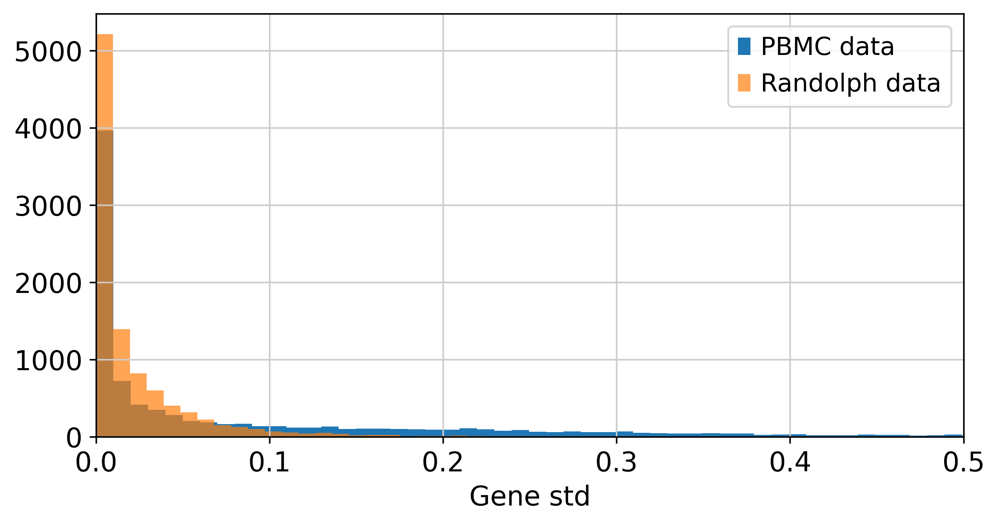

In [28]:
plt.figure(figsize=(8,4))
# fig, ax = plt.subplots(1,2, figsize=(10,4))
plt.hist(pmbcs_std[pmbcs_std < 1], bins=100)
plt.hist(r_std[r_std < 1], bins=100, alpha=0.7)
plt.legend(labels=['PBMC data', 'Randolph data'])
plt.xlim(0,0.5)

plt.xlabel('Gene std')
plt.show()

(0.0, 1.0)

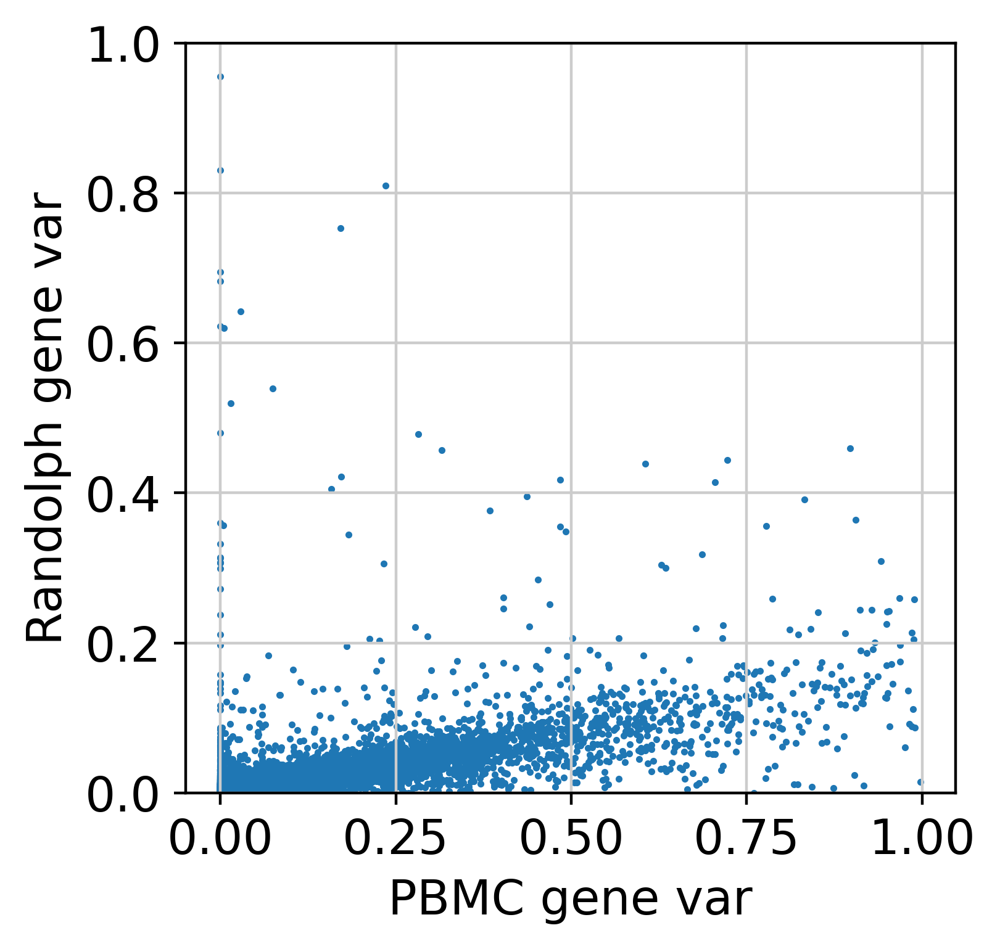

In [36]:
plt.scatter(pmbcs_std[pmbcs_std < 1], r_std[pmbcs_std < 1], s=1.)
plt.xlabel('PBMC gene var')
plt.ylabel('Randolph gene var')
plt.ylim(0,1)


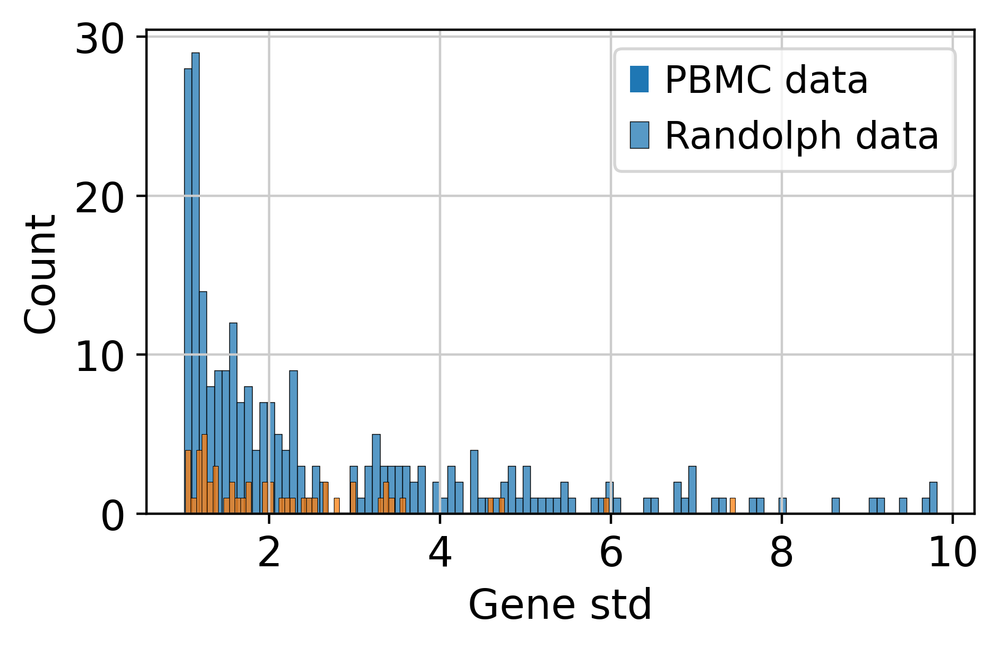

In [21]:
plt.figure(figsize=(5,3))
sns.histplot(pmbcs_std[(pmbcs_std > 1) & (pmbcs_std < 10)], bins=100)
sns.histplot(r_std[(r_std > 1) & (r_std < 10)], bins=100)
plt.legend(labels=['PBMC data', 'Randolph data'])
plt.xlabel('Gene std')

plt.show()

(0.0, 10.0)

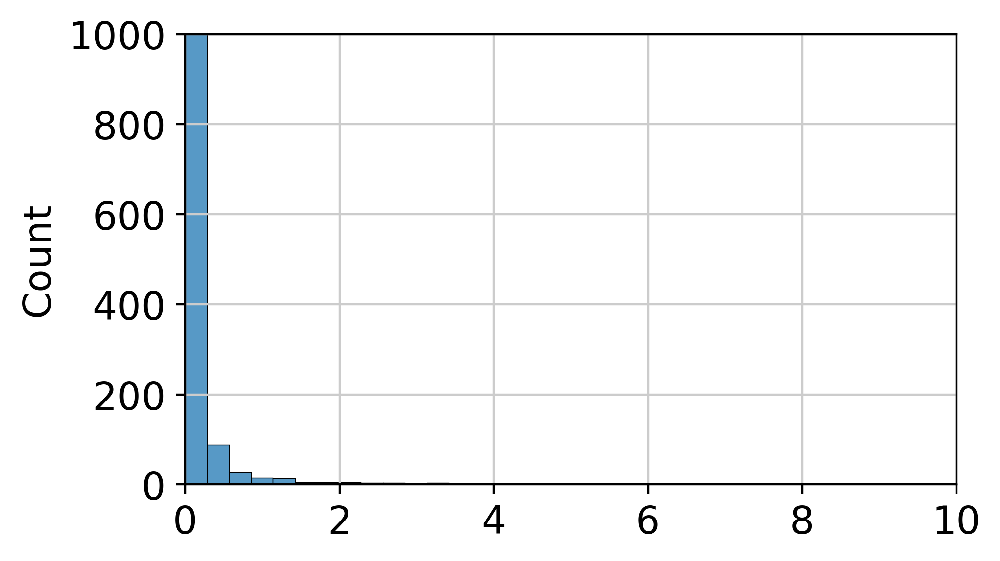

In [20]:
plt.figure(figsize=(5,3))
sns.histplot(r_std, bins=100)
plt.ylim(0, 1000)
plt.xlim(0, 10)

# map gene ids in Randolph to gene names

In [17]:
import pandas as pd

In [18]:
gene_names_df  = pd.read_csv('../data/gene_counts_Ensembl_105_phenotype_metadata.tsv', sep='\t')
gene_names_df.head()

,phenotype_id,quant_id,group_id,gene_id,chromosome,gene_start,gene_end,strand,gene_name,gene_type,gene_version,phenotype_pos,phenotype_gc_content,phenotype_length
0,ENSG00000223972,ENSG00000223972,ENSG00000223972,ENSG00000223972,1,11869,14409,1,DDX11L1,transcribed_unprocessed_pseudogene,5,11869,57.50,1735
1,ENSG00000227232,ENSG00000227232,ENSG00000227232,ENSG00000227232,1,14404,29570,-1,WASH7P,unprocessed_pseudogene,5,29570,54.43,1351
2,ENSG00000278267,ENSG00000278267,ENSG00000278267,ENSG00000278267,1,17369,17436,-1,MIR6859-1,miRNA,1,17436,61.76,68
3,ENSG00000243485,ENSG00000243485,ENSG00000243485,ENSG00000243485,1,29554,31109,1,MIR1302-2HG,lncRNA,5,29554,48.84,1021
4,ENSG00000284332,ENSG00000284332,ENSG00000284332,ENSG00000284332,1,30366,30503,1,MIR1302-2,miRNA,1,30366,31.16,138


In [36]:
gene_names_df['gene_version'].unique()

array([ 5,  1,  2,  3,  7,  6,  4, 10, 12, 11, 13, 15,  9, 18, 14, 19, 21,
       22, 17,  8, 20, 23, 16, 24, 32, 25, 29, 26, 27])

In [19]:
gene_id2gene_name = {k:v for k,v in zip(gene_names_df['gene_id'], gene_names_df['gene_name'])}

In [59]:
len(gene_id2gene_name), len(gene_names_df)

(61487, 61487)

In [51]:
len(adata_r.obs), len(adata_r.var_names)

(459422, 61533)

In [11]:
adata_r_gene_names = [gene_id2gene_name[v.split('.')[0]] if v.split('.')[0] in gene_id2gene_name else 'UNK' for v in adata_r.var_names]

In [20]:
adata_r_gene_ids = [v.split('.')[0]  for v in adata_r.var_names]

In [56]:
len(adata_r_gene_names), len(set(adata_r_gene_names))

(61533, 60286)

In [61]:
from collections import Counter
c = Counter(adata_r_gene_names)
c.most_common(10)

[('Y_RNA', 756),
 ('Metazoa_SRP', 170),
 ('U3', 50),
 ('U6', 33),
 ('SNORA70', 27),
 ('U8', 22),
 ('U2', 19),
 ('5S_rRNA', 9),
 ('SNORA72', 8),
 ('SNORA62', 7)]

In [21]:
pbmc_gene_names = set(pbmc_frac.var_names)

In [16]:
pbmc_frac.var_names

Index(['ENSG00000000419', 'ENSG00000000938', 'ENSG00000000971',
       'ENSG00000001036', 'ENSG00000001461', 'ENSG00000002549',
       'ENSG00000002587', 'ENSG00000002726', 'ENSG00000002745',
       'ENSG00000002933',
       ...
       'ENSG00000288531', 'ENSG00000288539', 'ENSG00000288555',
       'ENSG00000288560', 'ENSG00000288600', 'ENSG00000288611',
       'ENSG00000288638', 'ENSG00000288657', 'ENSG00000288679',
       'ENSG00000288685'],
      dtype='object', length=10000)

In [22]:
adata_r_obs_indx_of_hvg = {v:i for i, v in enumerate(adata_r_gene_ids) if v in pbmc_gene_names}

In [75]:
len(adata_r_obs_indx_of_hvg) # out of 4000

3933

In [23]:
len(adata_r_obs_indx_of_hvg) # out of 10K

9988

In [24]:
import scipy

adata_r_X_with_empty_clmn = scipy.sparse.hstack((adata_r.X, scipy.sparse.csr_matrix(np.zeros((adata_r.X.shape[0],1)))))

In [37]:
adata_r_X_with_empty_clmn.shape

(459422, 61534)

In [25]:
clmn_to_choose_from_adata_r = []
for i, gene_name in enumerate(pbmc_frac.var_names):
    if gene_name in adata_r_obs_indx_of_hvg:
        clmn_to_choose_from_adata_r.append(adata_r_obs_indx_of_hvg[gene_name])
    else:
        clmn_to_choose_from_adata_r.append(adata_r_X_with_empty_clmn.shape[1] - 1) # add all zeros column for gene not present in adata_r

In [97]:
np.unique(clmn_to_choose_from_adata_r, return_counts=True)

(array([   67,    68,    78,    85,    86,   128,   129, ..., 60920, 60968,
        60979, 60982, 60984, 61285, 61533]),
 array([  1,   1,   1,   1,   1,   1,   1, ...,   1,   1,   1,   1,   1,
          1, 859]))

In [26]:
adata_r.X_hvg = adata_r_X_with_empty_clmn.T[clmn_to_choose_from_adata_r]
adata_r.X_hvg = adata_r.X_hvg.T
adata_r.X_hvg.shape

(459422, 10000)

In [27]:
adata_r.obs['dataset'] = pd.Series(['Randolph'] * adata_r.X.shape[0], index=adata_r.obs.index)

In [28]:
adata_r.obs['sample_ID_lataq'] = pd.Series(['Randolph'] * adata_r.X.shape[0], index=adata_r.obs.index)

In [29]:
adata_r.obs['cell_type_for_integration'] = pd.Series(['UNK'] * adata_r.X.shape[0], index=adata_r.obs.index)

In [30]:
# variable annotations are from pmbc data!!!!
adata_r_processed = sc.AnnData(X=adata_r.X_hvg.toarray(), var=pbmc_frac.var, obs=adata_r.obs)

In [6]:
indx = adata_r_processed.obs.sample(frac=0.3, random_state=3, ignore_index=True)
obs = adata_r_processed.obs.iloc[list(indx.index)]
x = adata_r_processed.X[list(indx.index)]
adata_r_processed_frac = sc.AnnData(X=x, var=pbmc_frac.var, obs=obs)

In [ ]:
adata_r_processed_frac.X.shape

In [ ]:
adata_r_processed.write('../data/randolph_4000_hvg.h5ad')

In [31]:
adata_r_processed.write('../data/randolph_10000_hvg.h5ad')

In [4]:
adata_r_processed = sc.read('../data/randolph_10000_hvg.h5ad')

# Check if the reference PBMC data and model weights match

data - https://drive.google.com/drive/folders/1rmlZCacP_BZqf-XIyRuWQt2caTHFFCmY source.h5ad
weights - https://drive.google.com/drive/folders/1rmlZCacP_BZqf-XIyRuWQt2caTHFFCmY ref_model
reference umap - https://drive.google.com/drive/folders/1rmlZCacP_BZqf-XIyRuWQt2caTHFFCmY 

In [8]:
pbmc_source_adata = sc.read('/gpfs/space/home/dzvenymy/scarches/data/pbmc/hvg_4000/source_adata.h5ad')

In [105]:
pbmc_source_adata.X.shape

(29137, 4000)

In [110]:
pbmc_source_adata.obs.head()

,batch,chemistry,data_type,dpt_pseudotime,final_annotation,mt_frac,n_counts,n_genes,sample_ID,size_factors,species,study,tissue
index,,,,,,,,,,,,,
AAACCTGCAGCGAACA-1-Oetjen_A,Oetjen_A,v2_10X,UMI,NaN,CD16+ Monocytes,0.047970,6379.0,1862.0,0,0.957719,Human,Oetjen,Bone_Marrow
AAACCTGCATGTCCTC-1-Oetjen_A,Oetjen_A,v2_10X,UMI,NaN,CD4+ T cells,0.024928,4172.0,1082.0,0,0.425532,Human,Oetjen,Bone_Marrow
AAACCTGGTCGACTGC-1-Oetjen_A,Oetjen_A,v2_10X,UMI,NaN,CD14+ Monocytes,0.051907,6608.0,1618.0,0,0.773111,Human,Oetjen,Bone_Marrow
AAACCTGGTCGCTTCT-1-Oetjen_A,Oetjen_A,v2_10X,UMI,NaN,CD14+ Monocytes,0.041716,5034.0,1413.0,0,0.641188,Human,Oetjen,Bone_Marrow
AAACCTGTCCCGACTT-1-Oetjen_A,Oetjen_A,v2_10X,UMI,NaN,NKT cells,0.043522,3998.0,1127.0,0,0.452426,Human,Oetjen,Bone_Marrow


In [16]:
scpoli_model = scPoli(
    adata=pbmc_frac,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    embedding_dim=20,
    latent_dim=30,
    hidden_layer_sizes=[128,128,128]
    dr_rate=0.1,
    use_ln=True
)

Embedding dictionary:
 	Num conditions: 8
 	Embedding dim: 3
Encoder Architecture:
	Input Layer in, out and cond: 4000 256 3
	Hidden Layer 1 in/out: 256 64
	Mean/Var Layer in/out: 64 10
Decoder Architecture:
	First Layer in, out and cond:  10 64 3
	Hidden Layer 1 in/out: 64 256
	Output Layer in/out:  256 4000 



In [28]:
import pickle
setup_dict_path = '../models/pbmc_model/hvg_10000/attr.pkl'
with open(setup_dict_path, "rb") as handle:
            attr_dict = pickle.load(handle)
print(attr_dict.keys())

dict_keys(['beta_', 'cell_type_keys_', 'cell_types_', 'condition_key_', 'conditions_', 'dr_rate_', 'embedding_dim_', 'hidden_layer_sizes_', 'inject_condition_', 'input_dim_', 'is_trained_', 'labeled_indices_', 'landmarks_labeled_', 'landmarks_unlabeled_', 'latent_dim_', 'mmd_boundary_', 'mmd_on_', 'recon_loss_', 'unknown_ct_names_', 'use_bn_', 'use_ln_', 'use_mmd_', 'share_metadata_', 'prototypes_labeled_', 'prototypes_unlabeled_', 'embedding_max_norm_'])


## add necessary fields to attr dict

In [13]:
init_params = {
            "share_metadata": dct["share_metadata_"],
            "condition_key": dct["condition_key_"],
            "conditions": dct["conditions_"],
            "cell_type_keys": dct["cell_type_keys_"],
            "cell_types": dct["cell_types_"],
            "labeled_indices": dct["labeled_indices_"],
            "prototypes_labeled": dct["prototypes_labeled_"],
            "prototypes_unlabeled": dct["prototypes_unlabeled_"],
            "hidden_layer_sizes": dct["hidden_layer_sizes_"],
            "latent_dim": dct["latent_dim_"],
            "dr_rate": dct["dr_rate_"],
            "use_mmd": dct["use_mmd_"],
            "mmd_on": dct["mmd_on_"],
            "mmd_boundary": dct["mmd_boundary_"],
            "recon_loss": dct["recon_loss_"],
            "beta": dct["beta_"],
            "use_bn": dct["use_bn_"],
            "use_ln": dct["use_ln_"],
            "embedding_dim": dct["embedding_dim_"],
            "embedding_max_norm": dct["embedding_max_norm_"],
            "inject_condition": dct["inject_condition_"],
        }

NameError: name 'dct' is not defined

In [29]:
attr_dict["share_metadata_"] = True
attr_dict["prototypes_labeled_"] = attr_dict["landmarks_labeled_"]
attr_dict["prototypes_unlabeled_"] = attr_dict["landmarks_unlabeled_"]
attr_dict["embedding_max_norm_"] = 1
attr_dict['labeled_indices_'] = range(0,156019)


In [30]:
with open(setup_dict_path, 'wb') as handle:
    pickle.dump(attr_dict, handle)

# Load pretrained model

In [14]:
condition_key = 'sample_ID_lataq'
cell_type_key = ['cell_type_for_integration']

In [8]:
scpoli_model = scPoli.load('../models/pbmc_model/hvg_10000/', pbmc_frac)

AnnData object with n_obs × n_vars = 156019 × 10000
    obs: 'dataset', 'sample_ID_czi', 'subject_ID_czi', 'cell_type_ontology_term_id', 'cell_type', 'total_counts_lisa', 'batch_czi', 'assay_ontology_term_id', 'assay', 'development_stage_ontology_term_id', 'development_stage', 'disease_ontology_term_id', 'disease', 'ethnicity_ontology_term_id', 'ethnicity', 'organism_ontology_term_id', 'organism', 'sex_ontology_term_id', 'sex', 'tissue_ontology_term_id', 'tissue', 'cell_type_for_integration', 'sample_ID_lataq', 'batch'
    var: 'highly_variable-0', 'highly_variable_rank-0', 'means-0', 'variances-0', 'variances_norm-0', 'highly_variable_nbatches-0'
Embedding dictionary:
 	Num conditions: 2375
 	Embedding dim: 20
Encoder Architecture:
	Input Layer in, out and cond: 10000 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 30
Decoder Architecture:
	First Layer in, out and cond:  30 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out

# Train on pbmc data

In [17]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

scpoli_model.train(
    n_epochs=100,
    pretraining_epochs=40,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=5,
    batch_size=128 # default is 128
)

 |███████████████████-| 96.0%  - val_loss: 1532.6945641559 - val_trvae_loss: 1527.7482485564 - val_prototype_loss: 4.9463022688 - val_labeled_loss: 0.98926045585
ADJUSTED LR
 |████████████████████| 100.0%  - val_loss: 1526.8398225204 - val_trvae_loss: 1522.0587264351 - val_prototype_loss: 4.7811005426 - val_labeled_loss: 0.9562201085
Saving best state of network...
Best State was in Epoch 81


In [18]:
scpoli_model.save('../models/pbmc_model/hvg_4000/my_ref_model/')

# Visualize pbmc latent data

In [44]:
scpoli_model.model.eval()
data_latent_source = scpoli_model.get_latent(
    pbmc_frac.X.toarray(), 
    pbmc_frac.obs[condition_key].values,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = pbmc_frac.obs.copy()

In [45]:
sc.pp.neighbors(adata_latent_source, n_neighbors=15)
sc.tl.umap(adata_latent_source)

## 10K hvg pbmc

In [55]:
adata_latent_source_10_studies = adata_latent_source[adata_latent_source.obs['sample_ID_lataq'].isin(list(pbmc_frac.obs['sample_ID_lataq'].value_counts().index[:10]))]
adata_latent_source_10_studies.obs['sample_ID_lataq'].cat.remove_unused_categories(inplace=True)

In [63]:
import matplotlib

<AxesSubplot: title={'center': 'sample_ID_lataq'}, xlabel='UMAP1', ylabel='UMAP2'>

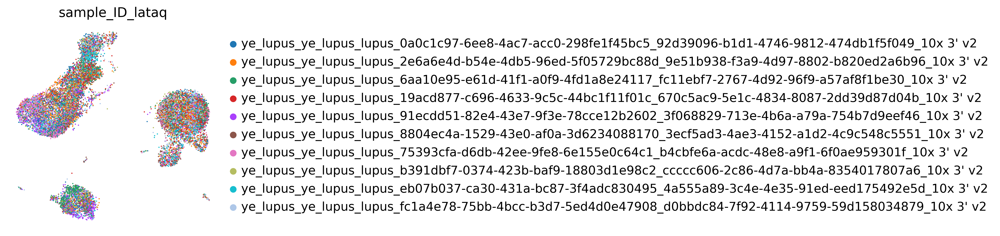

In [64]:
sc.pl.umap(
    adata_latent_source_10_studies, 
    color='sample_ID_lataq',
    show=False, 
    frameon=False,
    palette=matplotlib.rcParams["axes.prop_cycle"]
    # legend_loc=None,
)

<AxesSubplot: title={'center': 'cell_type_for_integration'}, xlabel='UMAP1', ylabel='UMAP2'>

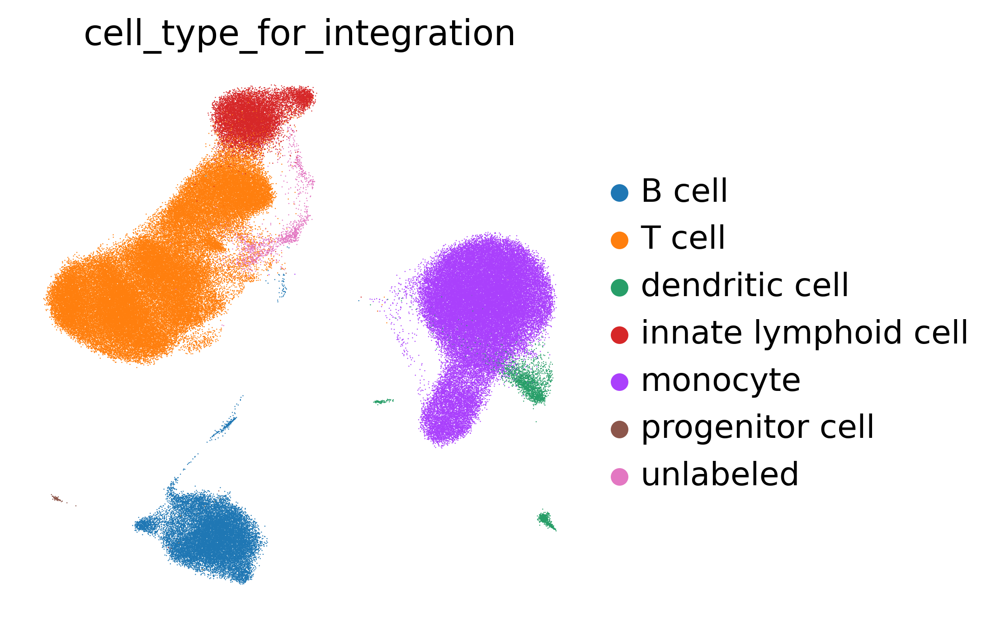

In [65]:
sc.pl.umap(
    adata_latent_source, 
    color='cell_type_for_integration',
    show=False, 
    frameon=False,
)

## 4K hvg pbmc

<AxesSubplot: title={'center': 'final_annotation'}, xlabel='UMAP1', ylabel='UMAP2'>

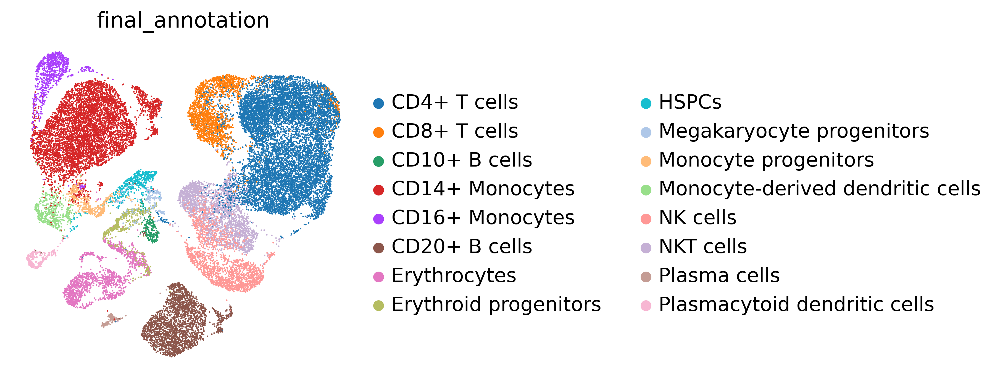

In [15]:
# conditioned on study
sc.pl.umap(
    adata_latent_source, 
    color='final annotation,
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'study'}, xlabel='UMAP1', ylabel='UMAP2'>

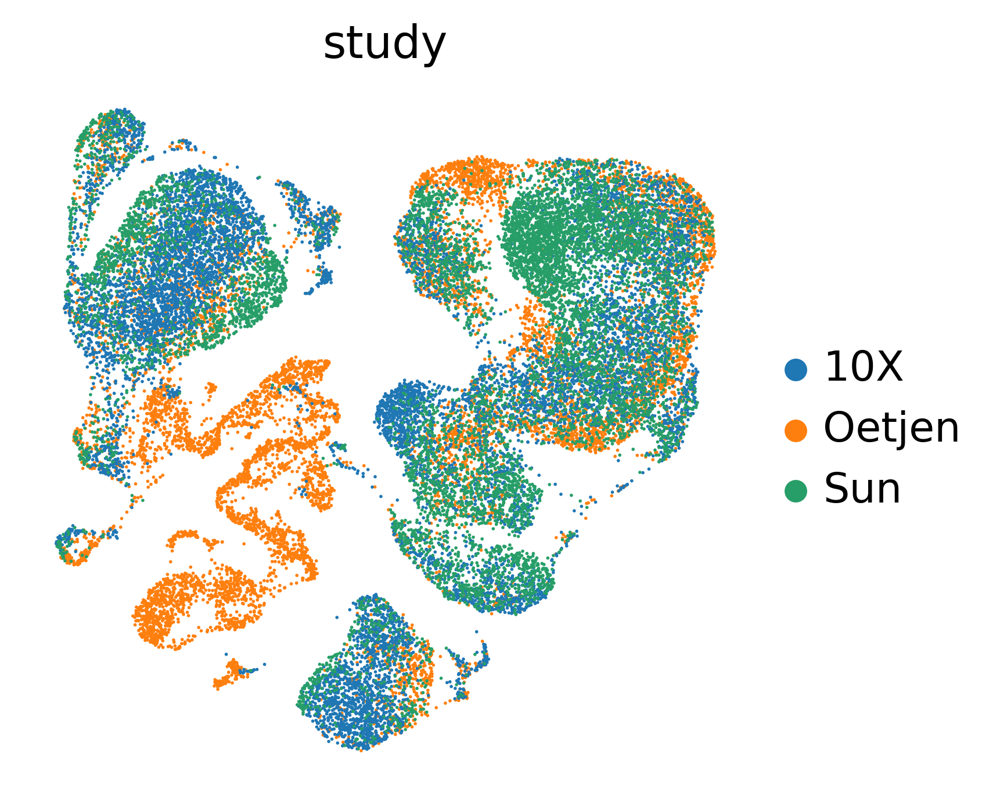

In [16]:
# conditioned on study
sc.pl.umap(
    adata_latent_source, 
    color='study',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'final_annotation'}, xlabel='UMAP1', ylabel='UMAP2'>

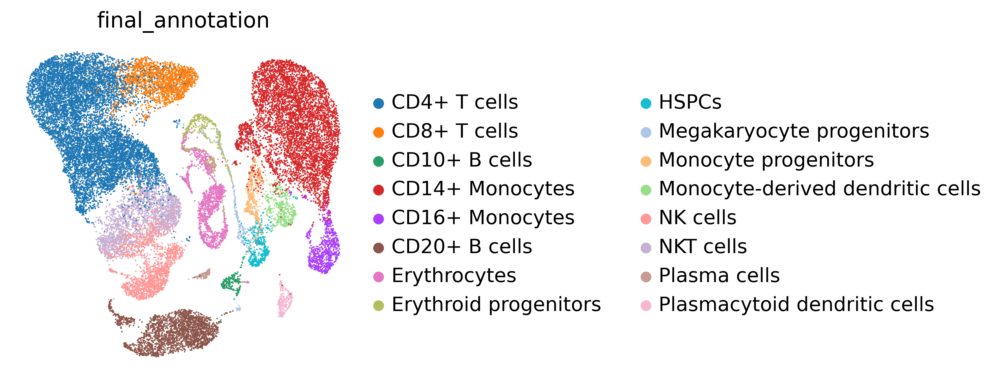

In [22]:
# conditioned on batch
sc.pl.umap(
    adata_latent_source, 
    color='final_annotation',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'batch'}, xlabel='UMAP1', ylabel='UMAP2'>

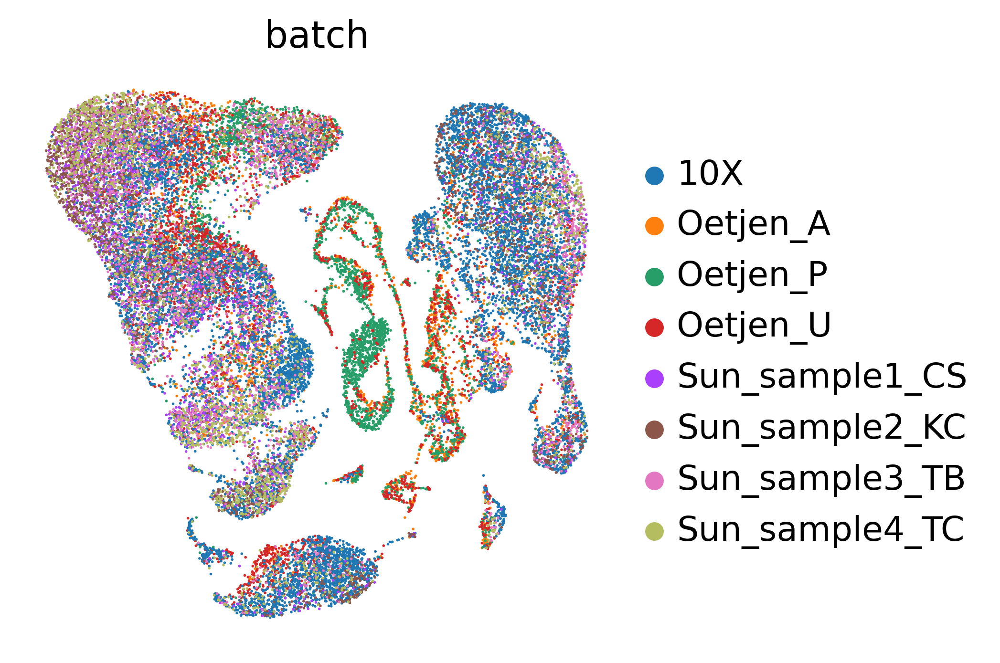

In [23]:
# conditioned on batch
sc.pl.umap(
    adata_latent_source, 
    color='batch',
    show=False, 
    frameon=False,
)

# Add Randolph data to the model

In [9]:
scpoli_query = scPoli.load_query_data(
    adata=adata_r_processed,
    reference_model=scpoli_model,
    labeled_indices=[],
)

Embedding dictionary:
 	Num conditions: 2376
 	Embedding dim: 20
Encoder Architecture:
	Input Layer in, out and cond: 10000 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 30
Decoder Architecture:
	First Layer in, out and cond:  30 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 10000 



In [33]:
adata_r_processed.X.shape

(459422, 10000)

In [10]:
pbmc_source_adata.X.shape

(29137, 4000)

In [10]:
scpoli_query.train(
    n_epochs=120,
    pretraining_epochs=100,
    eta=5
)

Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
 |██████████████------| 73.3%  - val_loss: 146.4756387695 - val_trvae_loss: 146.4756387695Leiden Clustering succesful. Found 31 clusters.
<class 'torch.Tensor'>
<built-in method size of Tensor object at 0x2ac41d6962a0>
 |████████████████----| 84.2%  - val_loss: 146.4941086410 - val_trvae_loss: 146.4941086410 - val_prototype_loss: 0.0000000000 - val_unlabeled_loss: 0.0000000000<class 'torch.Tensor'>
<built-in method size of Tensor object at 0x2ac41d6962a0>
 |█████████████████---| 85.0%  - val_loss: 146.5234205836 - val_trvae_loss: 146.5234205836 - val_prototype_loss: 0.0000000000 - val_unlabeled_loss: 0.0000000000<class 'torch.Tensor'>
<built-in method size of Tensor object at 0x2ac41d6962a0>
 |█████████████████---| 85.8%  - val_loss: 146.4799207300 - val_trvae_loss: 146.4799207

In [13]:
scpoli_query.save('../models/pbmc_model/hvg_10000_all_randolph/')

ValueError: ../models/pbmc_model/hvg_10000_all_randolph/ already exists. Please provide an unexisting directory for saving.

# Visualize integrated Randolph data

In [15]:
results_dict = scpoli_query.classify(
    adata_r_processed.X, 
    adata_r_processed.obs[condition_key], 
)

In [16]:
results_dict.keys()

dict_keys(['cell_type_for_integration'])

In [16]:
scpoli_model.model.eval()
data_latent_source = scpoli_model.get_latent(
    pbmc_frac.X.toarray(), 
    pbmc_frac.obs[condition_key].values,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = pbmc_frac.obs.copy()


#get latent representation of query data
data_latent= scpoli_query.get_latent(
    adata_r_processed.X, 
    adata_r_processed.obs[condition_key].values,
    mean=True
)

adata_latent = sc.AnnData(data_latent)
adata_latent.obs = adata_r_processed.obs.copy()

#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict[cell_type_key[0]]['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict[cell_type_key[0]]['uncert'].tolist()
# adata_latent.obs['classifier_outcome'] = (
#     adata_latent.obs['cell_type_pred'] == adata_latent.obs['cell_type']
# )

#get prototypes
labeled_prototypes = scpoli_query.get_prototypes_info()
labeled_prototypes.obs[condition_key] = 'labeled prototype'
unlabeled_prototypes = scpoli_query.get_prototypes_info(prototype_set='unlabeled')
unlabeled_prototypes.obs[condition_key] = 'unlabeled prototype'

#join adatas
indx = adata_latent.obs.sample(frac=0.1, random_state=3, ignore_index=True)
obs = adata_latent.obs.iloc[list(indx.index)]
x = adata_latent.X[list(indx.index)]
adata_latent_sample = sc.AnnData(X=x, var=adata_latent.var, obs=obs) 


adata_latent_full = adata_latent_source.concatenate(
    [adata_latent_sample, labeled_prototypes, unlabeled_prototypes], 
    batch_key='query'
)
adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = np.nan
adata_latent_full.obs['batch'][adata_latent_full.obs['query'].isin(['1'])] = np.nan

sc.pp.neighbors(adata_latent_full, n_neighbors=15)
sc.tl.umap(adata_latent_full)

In [18]:
adata_no_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['0', '1'])]

<AxesSubplot: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

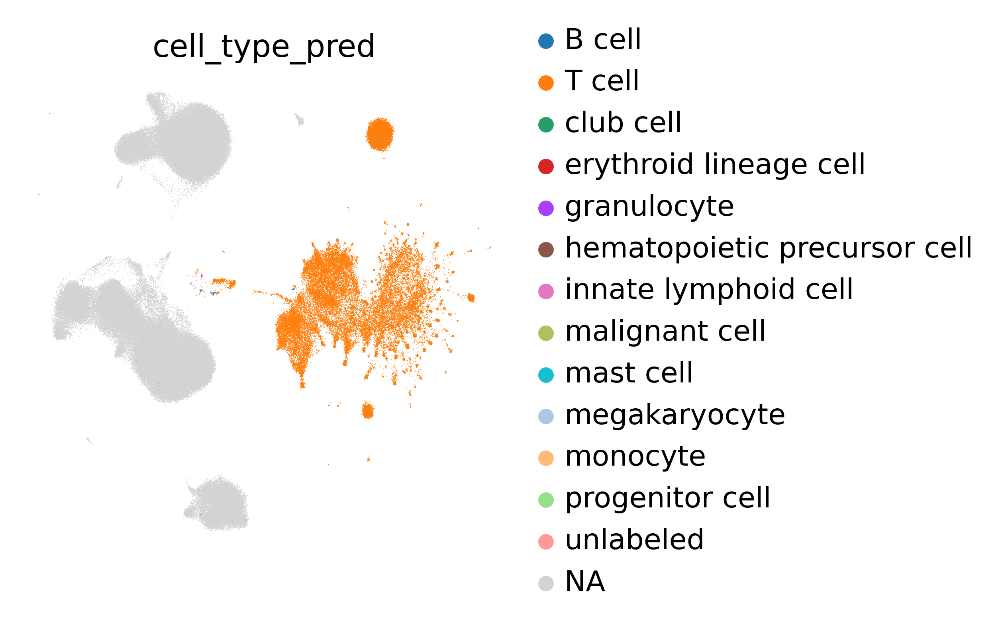

In [23]:
# whole  Randalph, 120 epochs, 20 prototypes
# 10000 hvg
sc.pl.umap(
    adata_no_prototypes, 
    color='cell_ty',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'dataset'}, xlabel='UMAP1', ylabel='UMAP2'>

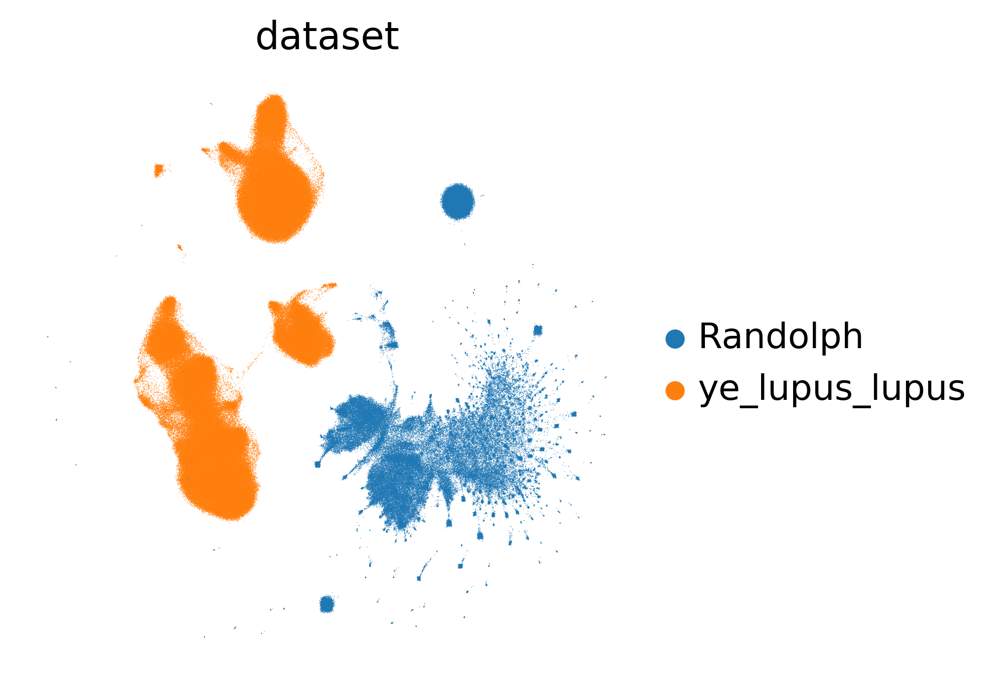

In [22]:
# 0.3 fraction of Randalph
# 10000 hvg
sc.pl.umap(
    adata_no_prototypes, 
    color='dataset',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

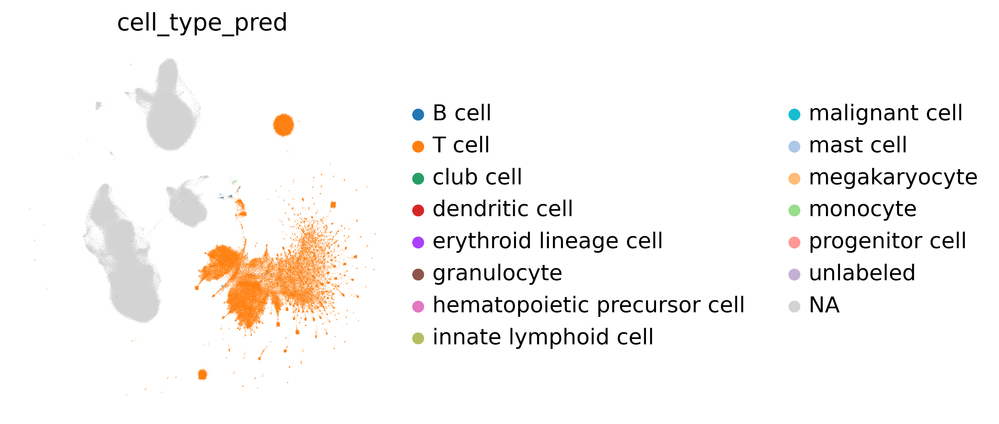

In [19]:
# 0.3 fraction of Randalph
# 10000 hvg
sc.pl.umap(
    adata_no_prototypes, 
    color='cell_type_pred',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'batch'}, xlabel='UMAP1', ylabel='UMAP2'>

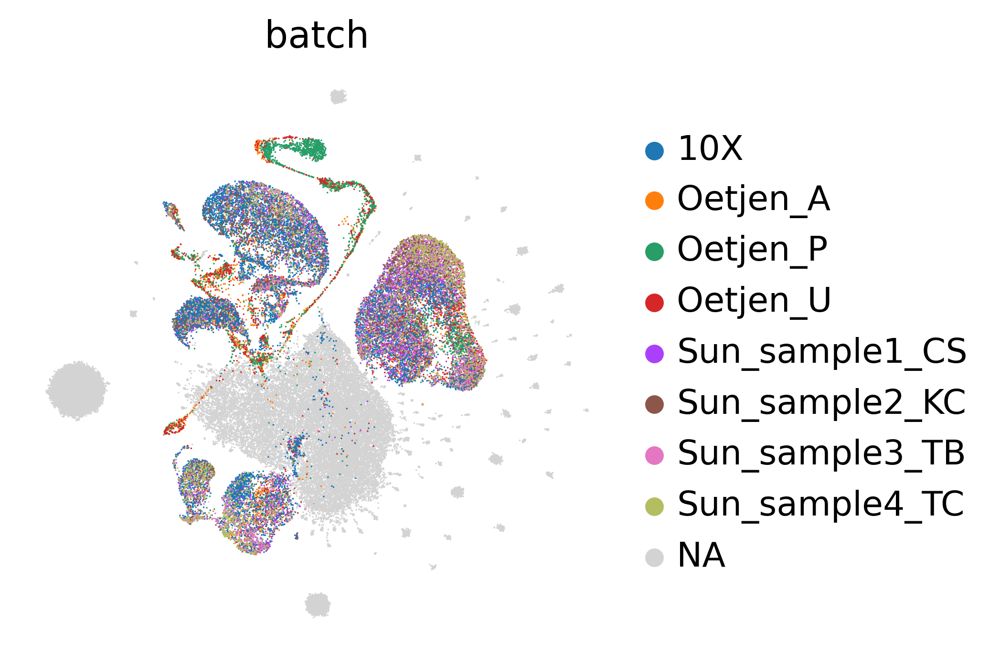

In [49]:
# full Randalph
# 4000 hvg
sc.pl.umap(
    adata_no_prototypes, 
    color='batch',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

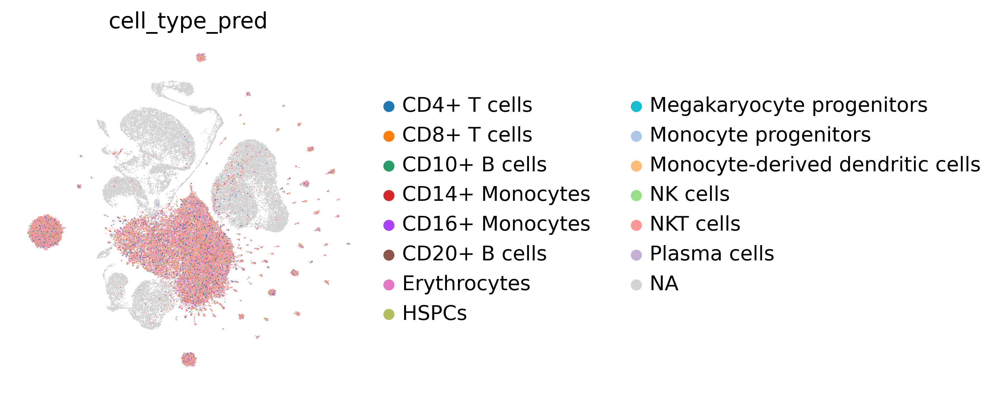

In [107]:
# full Randalph
# 4000 hvg
sc.pl.umap(
    adata_no_prototypes, 
    color='cell_type_pred',
    show=False, 
    frameon=False,
)

## Pancreas example

In [6]:
adata = sc.read('../data/pancreas_normalized.h5ad')
adata

AnnData object with n_obs × n_vars = 15681 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

In [7]:
adata.obs['study'].unique()

['Pancreas inDrop', 'Pancreas CelSeq2', 'Pancreas CelSeq', 'Pancreas Fluidigm C1', 'Pancreas SS2']
Categories (5, object): ['Pancreas CelSeq', 'Pancreas CelSeq2', 'Pancreas Fluidigm C1', 'Pancreas SS2', 'Pancreas inDrop']

In [12]:
adata.obs['batch'].unique()

['0', '1']
Categories (2, object): ['0', '1']

In [13]:
adata.obs['size_factors'].unique()

array([ 13073.,  17227.,   7844.,  10966.,   8815.,   9032.,   9938., ...,
        24683., 219414., 221018., 161140., 144527., 125932.,  89241.],
      dtype=float32)

In [16]:
adata.X.shape

(15681, 1000)

In [5]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


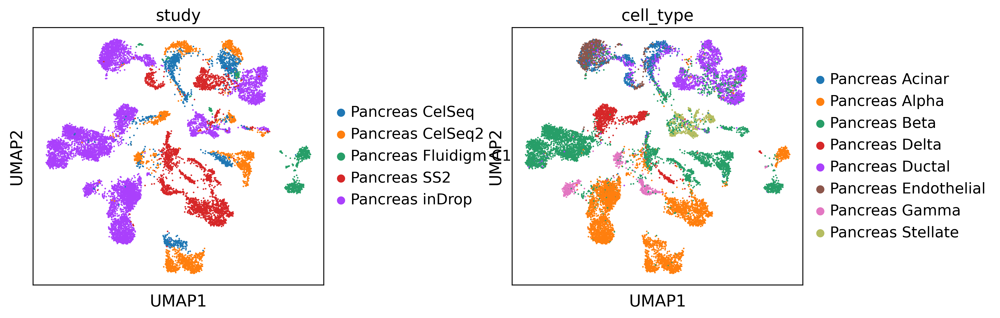

In [6]:
sc.pl.umap(adata, color=['study', 'cell_type'], wspace=0.5)

In [7]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

condition_key = 'study'
cell_type_key = ['cell_type']
# reference = [
#     'inDrop1', 
#     'inDrop2', 
#     'inDrop3', 
#     'inDrop4', 
#     'fluidigmc1', 
#     'smartseq2', 
#     'smarter'
# ]
# query = ['celseq', 'celseq2']

reference = ['Pancreas inDrop', 'Pancreas Fluidigm C1', 'Pancreas SS2']
query = ['Pancreas CelSeq2', 'Pancreas CelSeq']

## Reference - query split
We split our data in a group of reference datasets to be used for reference building, and a group of query datasets that we will map.

In order to simulate an unknown cell type scenario, we manually remove beta cells from the reference.

In [8]:
adata.obs['query'] = adata.obs[condition_key].isin(query)
adata.obs['query'] = adata.obs['query'].astype('category')
source_adata = adata[adata.obs.study.isin(reference)].copy()
source_adata = source_adata[~source_adata.obs.cell_type.str.contains('Alpha')].copy()
target_adata = adata[adata.obs.study.isin(query)].copy()

In [10]:
source_adata, target_adata

(AnnData object with n_obs × n_vars = 8385 × 1000
     obs: 'batch', 'study', 'cell_type', 'size_factors', 'query',
 AnnData object with n_obs × n_vars = 3697 × 1000
     obs: 'batch', 'study', 'cell_type', 'size_factors', 'query')

In [11]:
target_adata.obs.cell_type.unique()

['Pancreas Alpha', 'Pancreas Delta', 'Pancreas Beta', 'Pancreas Ductal', 'Pancreas Acinar', 'Pancreas Gamma', 'Pancreas Endothelial', 'Pancreas Stellate']
Categories (8, object): ['Pancreas Acinar', 'Pancreas Alpha', 'Pancreas Beta', 'Pancreas Delta', 'Pancreas Ductal', 'Pancreas Endothelial', 'Pancreas Gamma', 'Pancreas Stellate']

In [12]:
source_adata.obs.cell_type.unique()

['Pancreas Endothelial', 'Pancreas Acinar', 'Pancreas Beta', 'Pancreas Delta', 'Pancreas Stellate', 'Pancreas Ductal', 'Pancreas Gamma']
Categories (7, object): ['Pancreas Acinar', 'Pancreas Beta', 'Pancreas Delta', 'Pancreas Ductal', 'Pancreas Endothelial', 'Pancreas Gamma', 'Pancreas Stellate']

## Train reference scPoli model on fully labeled reference data

In [9]:
scpoli_model = scPoli(
    adata=source_adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    embedding_dim=3,
)

Embedding dictionary:
 	Num conditions: 3
 	Embedding dim: 3
Encoder Architecture:
	Input Layer in, out and cond: 1000 256 3
	Hidden Layer 1 in/out: 256 64
	Mean/Var Layer in/out: 64 10
Decoder Architecture:
	First Layer in, out and cond:  10 64 3
	Hidden Layer 1 in/out: 64 256
	Output Layer in/out:  256 1000 



In [10]:
scpoli_model.train(
    n_epochs=50,
    pretraining_epochs=40,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=5,
    batch_size=64 # default is 128
)

 |████████████████████| 100.0%  - val_loss: 714.2784729004 - val_trvae_loss: 706.9537309919 - val_prototype_loss: 7.3247421810 - val_labeled_loss: 1.4649484328
Saving best state of network...
Best State was in Epoch 49


In [11]:
scpoli_model.hidden_layer_sizes_

[256, 64]

## Reference mapping of unlabeled query datasets

In [15]:
scpoli_query = scPoli.load_query_data(
    adata=target_adata,
    reference_model=scpoli_model,
    labeled_indices=[],
)

Embedding dictionary:
 	Num conditions: 5
 	Embedding dim: 3
Encoder Architecture:
	Input Layer in, out and cond: 1000 256 3
	Hidden Layer 1 in/out: 256 64
	Mean/Var Layer in/out: 64 10
Decoder Architecture:
	First Layer in, out and cond:  10 64 3
	Hidden Layer 1 in/out: 64 256
	Output Layer in/out:  256 1000 



In [16]:
scpoli_query.train(
    n_epochs=50,
    pretraining_epochs=40,
    eta=5
)

Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
 |████████████████----| 80.0%  - val_loss: 1003.4514363607 - val_trvae_loss: 1003.4514363607
Initializing unlabeled prototypes with Leiden-Clustering with an unknown number of clusters.
Leiden Clustering succesful. Found 19 clusters.
 |████████████████████| 100.0%  - val_loss: 994.2330729167 - val_trvae_loss: 994.2330729167 - val_prototype_loss: 0.0000000000 - val_unlabeled_loss: 0.00000000000
Saving best state of network...
Best State was in Epoch 48


## Label transfer from reference to query

In [17]:
results_dict = scpoli_query.classify(
    target_adata.X, 
    target_adata.obs[condition_key], 
)

Let's check the label transfer performance we achieved.

In [18]:
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]["preds"]
    results_dict[cell_type_key[i]]["uncert"]
    classification_df = pd.DataFrame(
        classification_report(
            y_true=target_adata.obs[cell_type_key[i]],
            y_pred=preds,
            output_dict=True,
        )
    ).transpose()
print(classification_df)

                      precision    recall  f1-score      support
Pancreas Acinar        0.547535  0.936747  0.691111   332.000000
Pancreas Alpha         0.000000  0.000000  0.000000  1105.000000
Pancreas Beta          0.672915  0.763018  0.715139   941.000000
Pancreas Delta         0.341722  0.973585  0.505882   265.000000
Pancreas Ductal        0.852761  0.775453  0.812272   717.000000
Pancreas Endothelial   0.446809  0.308824  0.365217    68.000000
Pancreas Gamma         0.302128  0.972603  0.461039   146.000000
Pancreas Stellate      0.884058  0.991870  0.934866   123.000000
accuracy               0.575602  0.575602  0.575602     0.575602
macro avg              0.505991  0.715262  0.560691  3697.000000
weighted avg           0.459890  0.575602  0.493911  3697.000000


In [40]:
scpoli_query.prototypes_labeled_['mean'].shape

torch.Size([8, 10])

In [41]:
scpoli_query.prototypes_unlabeled_['mean'].shape

torch.Size([19, 10])

In [19]:
#get latent representation of reference data
scpoli_query.model.eval()
data_latent_source = scpoli_query.get_latent(
    source_adata.X, 
    source_adata.obs[condition_key].values,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = source_adata.obs.copy()

#get latent representation of query data
data_latent= scpoli_query.get_latent(
    target_adata.X, 
    target_adata.obs[condition_key].values,
    mean=True
)

adata_latent = sc.AnnData(data_latent)
adata_latent.obs = target_adata.obs.copy()

#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict['cell_type']['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict['cell_type']['uncert'].tolist()
adata_latent.obs['classifier_outcome'] = (
    adata_latent.obs['cell_type_pred'] == adata_latent.obs['cell_type']
)

#get prototypes
labeled_prototypes = scpoli_query.get_prototypes_info()
labeled_prototypes.obs['study'] = 'labeled prototype'
unlabeled_prototypes = scpoli_query.get_prototypes_info(prototype_set='unlabeled')
unlabeled_prototypes.obs['study'] = 'unlabeled prototype'

#join adatas
adata_latent_full = adata_latent_source.concatenate(
    [adata_latent, labeled_prototypes, unlabeled_prototypes], 
    batch_key='query'
)
adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = np.nan
sc.pp.neighbors(adata_latent_full, n_neighbors=15)
sc.tl.umap(adata_latent_full)

In [20]:
#get adata without prototypes
adata_no_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['0', '1'])]

<AxesSubplot: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

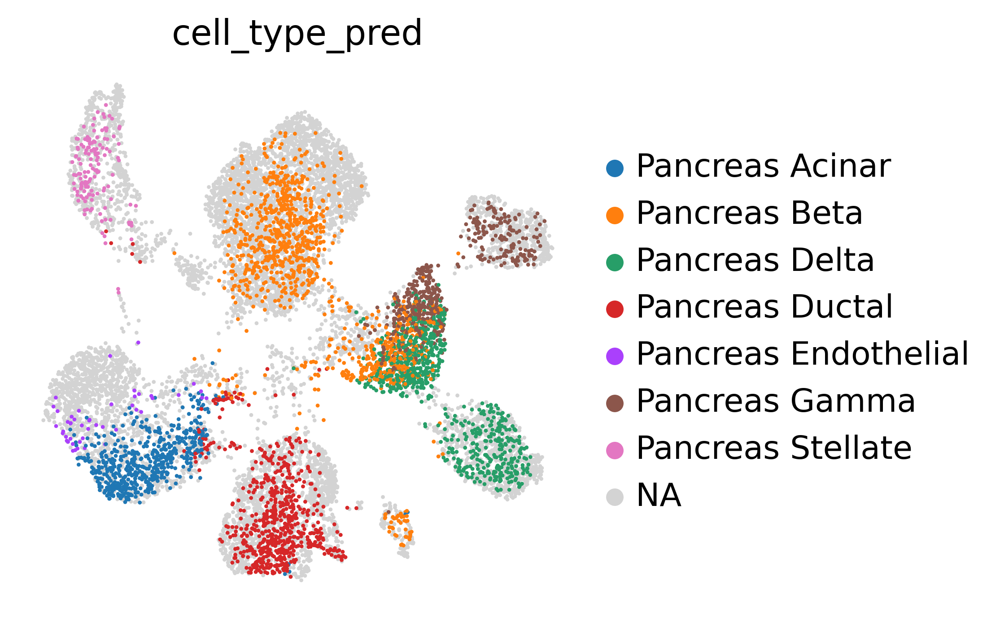

In [21]:
sc.pl.umap(
    adata_no_prototypes, 
    color='cell_type_pred',
    show=False, 
    frameon=False,
)

<AxesSubplot: title={'center': 'study'}, xlabel='UMAP1', ylabel='UMAP2'>

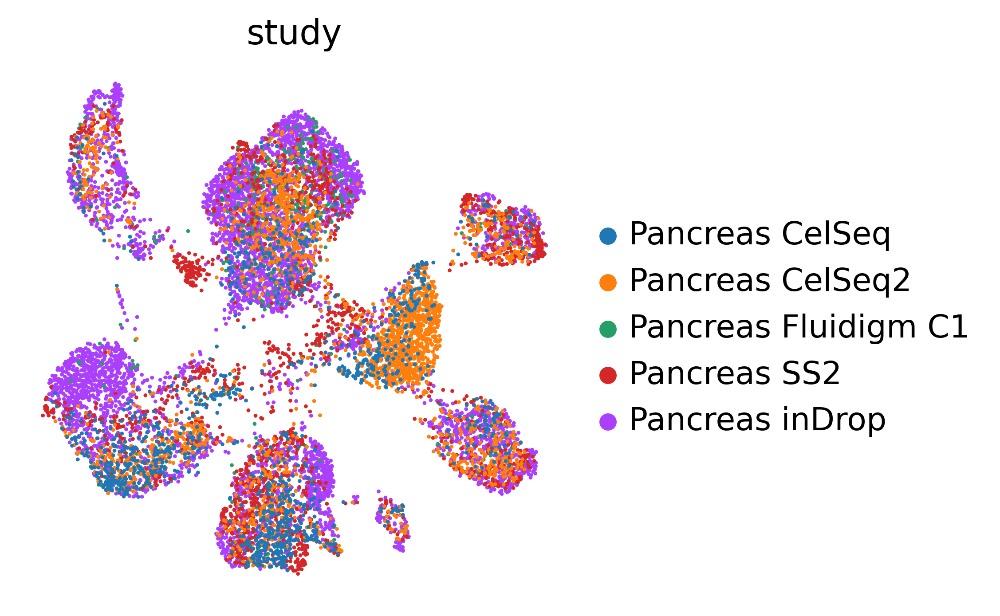

In [22]:
sc.pl.umap(
    adata_no_prototypes, 
    color='study',
    show=False, 
    frameon=False,
)

## Inspect uncertainty
We can look at the uncertainty of each prediction and either select a threshold after visual inspection or by looking at the percentiles of the uncertainties distribution.

<AxesSubplot: title={'center': 'cell_type_uncert'}, xlabel='UMAP1', ylabel='UMAP2'>

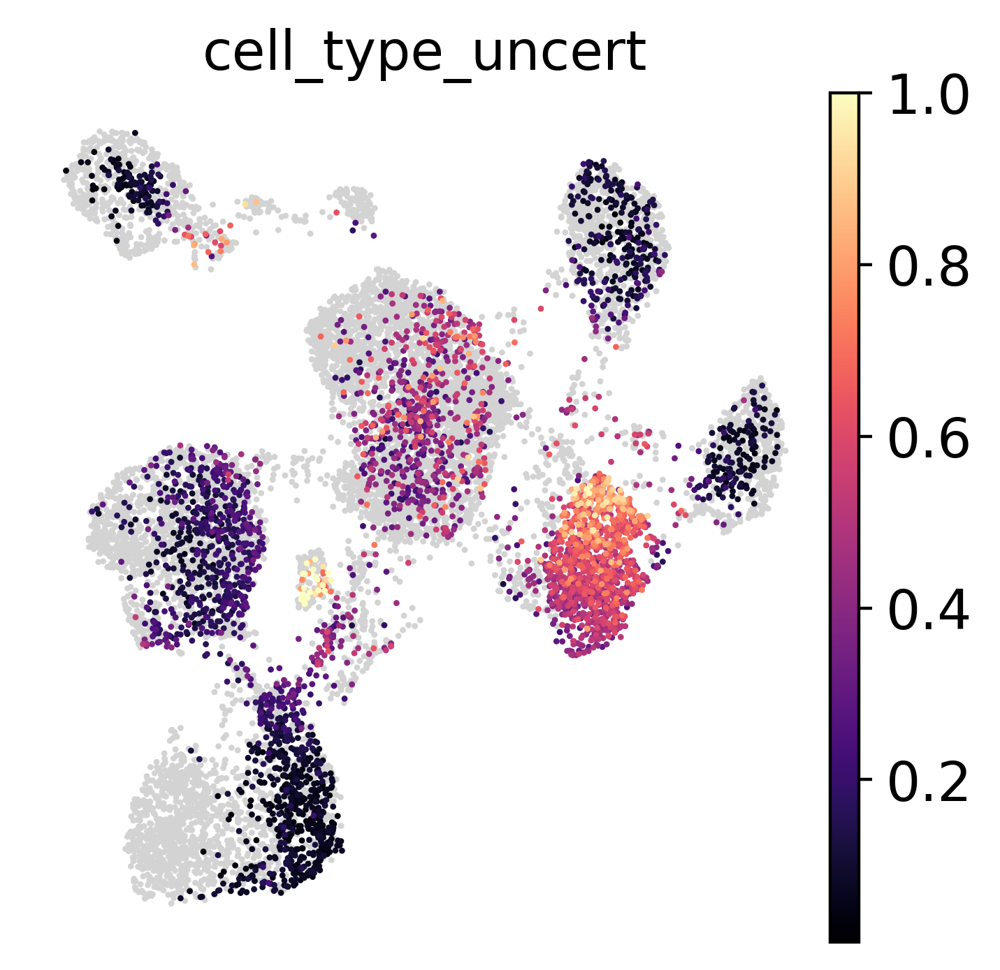

In [47]:
sc.pl.umap(
    adata_no_prototypes, 
    color='cell_type_uncert',
    show=False, 
    frameon=False,
    cmap='magma',
    vmax=1
)

## Inspect prototypes

In [26]:
adata_latent_full.obs['query']

0-0-0-0-0-0    0
1-0-0-0-0-0    0
2-0-0-0-0-0    0
3-0-0-0-0-0    0
4-0-0-0-0-0    0
              ..
14-3           3
15-3           3
16-3           3
17-3           3
18-3           3
Name: query, Length: 12108, dtype: category
Categories (4, object): ['0', '1', '2', '3']

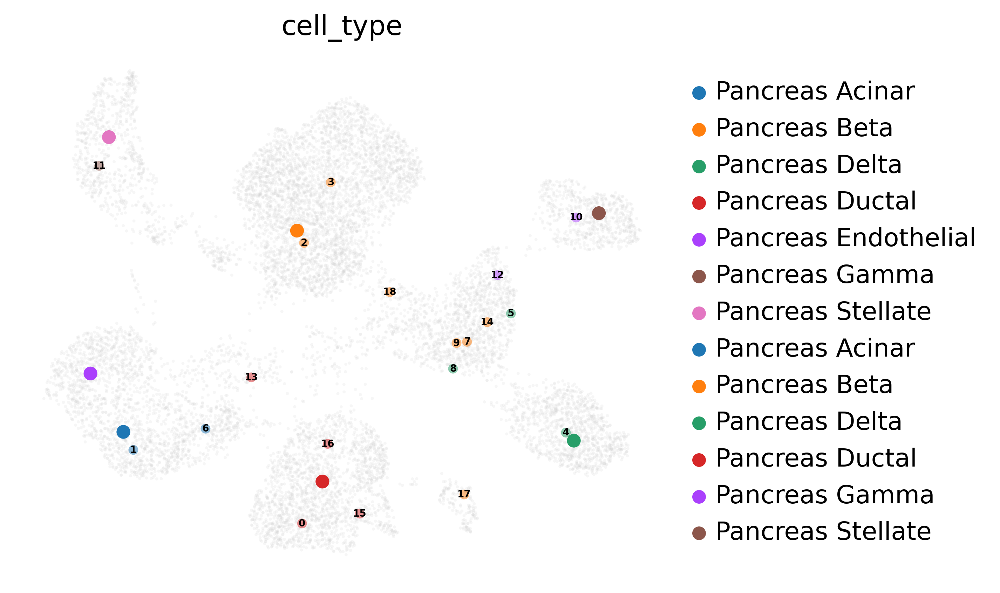

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(6, 5))
adata_labeled_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['2'])]
adata_unlabeled_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['3'])]
adata_labeled_prototypes.obs['cell_type_pred'] = adata_labeled_prototypes.obs['cell_type_pred'].astype('category')
adata_unlabeled_prototypes.obs['cell_type_pred'] = adata_unlabeled_prototypes.obs['cell_type_pred'].astype('category')
adata_unlabeled_prototypes.obs['cell_type'] = adata_unlabeled_prototypes.obs['cell_type'].astype('category')

sc.pl.umap(
    adata_no_prototypes, 
    alpha=0.2, 
    show=False, 
    ax=ax
)
ax.legend([])
# plot labeled prototypes
sc.pl.umap(
    adata_labeled_prototypes,
    size=200,
    color=f'{cell_type_key[0]}_pred',
    ax=ax,
    show=False,
    frameon=False,
)
# plot labeled prototypes
sc.pl.umap(
    adata_unlabeled_prototypes,
    size=100,
    color=[cell_type_key[0] + '_pred'],
    palette=adata_labeled_prototypes.uns['cell_type_pred_colors'],
    ax=ax,
    show=False,
    frameon=False,
    alpha=0.5,
)
sc.pl.umap(
    adata_unlabeled_prototypes,
    size=0,
    color=cell_type_key[0],
    frameon=False,
    ax=ax,
    legend_loc='on data',
    legend_fontsize=5,
)
ax.set_title('Landmarks')
fig.tight_layout()

After inspecting the prototypes we can observe that unlabeled prototype 4, 5, 7, 8, 11 and 13 fall into the region of high uncertainty. With this knowledge, we can add a new labeled prototype.

In [36]:
cell_type_key

['cell_type']

In [29]:
scpoli_query.add_new_cell_type(
    "Pancreas Alpha", 
    cell_type_key[0], 
    [5,7,8,9,14]
)

In [30]:
results_dict = scpoli_query.classify(
    target_adata.X, 
    target_adata.obs[condition_key], 
)

In [31]:
#get latent representation of reference data
scpoli_query.model.eval()
data_latent_source = scpoli_query.get_latent(
    source_adata.X, 
    source_adata.obs[condition_key].values,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = source_adata.obs.copy()

#get latent representation of query data
data_latent= scpoli_query.get_latent(
    target_adata.X, 
    target_adata.obs[condition_key].values,
    mean=True
)

adata_latent = sc.AnnData(data_latent)
adata_latent.obs = target_adata.obs.copy()

#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict['cell_type']['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict['cell_type']['uncert'].tolist()
adata_latent.obs['classifier_outcome'] = (
    adata_latent.obs['cell_type_pred'] == adata_latent.obs['cell_type']
)

#join adatas
adata_latent_full = adata_latent_source.concatenate(
    [adata_latent, labeled_prototypes, unlabeled_prototypes], 
    batch_key='query'
)
adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = np.nan
sc.pp.neighbors(adata_latent_full, n_neighbors=15)
sc.tl.umap(adata_latent_full)

<AxesSubplot: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

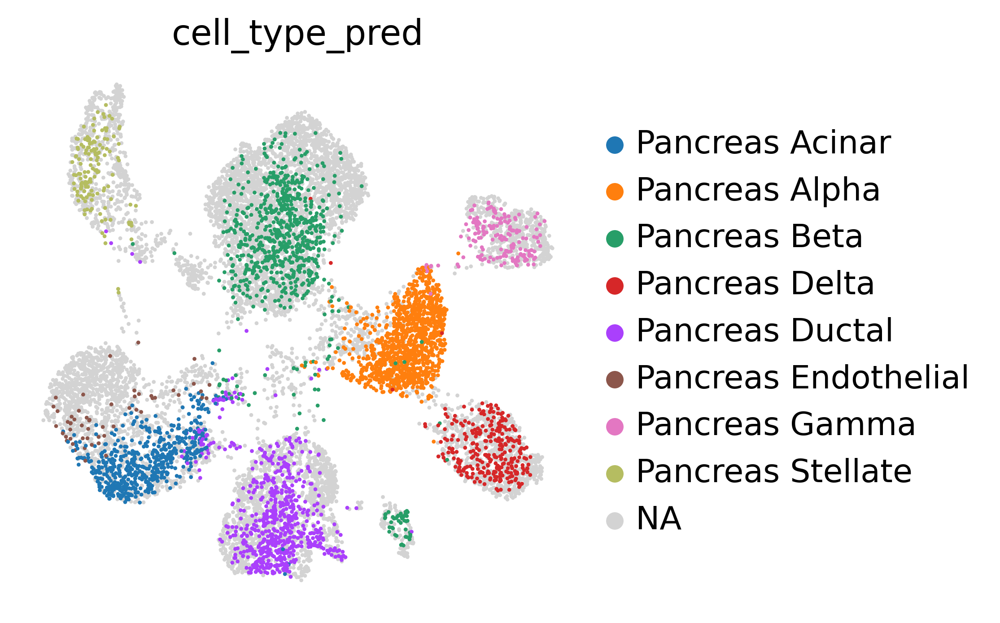

In [32]:
sc.pl.umap(
    adata_latent_full, 
    color='cell_type_pred',
    show=False, 
    frameon=False,
)

We can now see that the alpha cell cluster is correctly classified.

## Sample embeddings

We can extract the conditional embeddings learnt by scPoli and analyse them.

In [24]:
adata_emb = scpoli_query.get_conditional_embeddings()

ValueError: Length of passed value for obs_names is 176, but this AnnData has shape: (2376, 20)

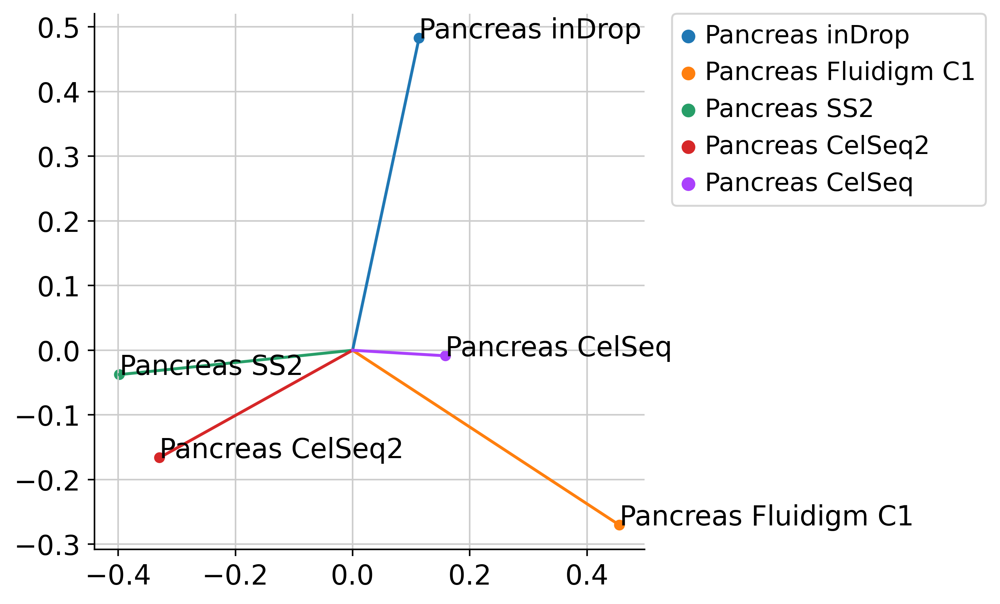

In [34]:
from sklearn.decomposition import KernelPCA
pca = KernelPCA(n_components=2, kernel='linear')
emb_pca = pca.fit_transform(adata_emb.X)
conditions = scpoli_query.conditions_
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(x=emb_pca[:, 0], y=emb_pca[:, 1], hue=conditions, ax=ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for i, c in enumerate(conditions):
    ax.plot([0, emb_pca[i, 0]], [0, emb_pca[i, 1]])
    ax.text(emb_pca[i, 0], emb_pca[i, 1], c)
sns.despine()